# Project - Classification

HOTEL RESERVATIONS dataset
https://www.kaggle.com/datasets/ahsan81/hotel-reservations-classification-dataset

### Installing and importing libraries

In [ ]:
pip install ydata-profiling

In [ ]:
pip install lazypredict

In [ ]:
# Data preparation and analysis
import pandas as pd
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
# Models
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from lazypredict.Supervised import LazyClassifier
from xgboost import XGBClassifier
# Evaluation metrics
from sklearn.metrics import recall_score, roc_auc_score, f1_score, classification_report, precision_score
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix, roc_curve
# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import warnings



### Data preparation

In [ ]:
DATA_REPORT = True
SAMPLING_USE = False
SAMPLE_SIZE = 10000
APPLY_CORRELATION = True
THRESHOLD = 0.06

Loading source file

In [ ]:
df = pd.read_csv("Hotel Reservations.csv")

In [ ]:
# in case sampling is used
if SAMPLING_USE:
  df = df.sample(SAMPLE_SIZE)

Dataframe information / Descriptive statistics

In [ ]:
df.info()
describe_df = df.describe().T
describe_df

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36275 entries, 0 to 36274
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Booking_ID                            36275 non-null  object 
 1   no_of_adults                          36275 non-null  int64  
 2   no_of_children                        36275 non-null  int64  
 3   no_of_weekend_nights                  36275 non-null  int64  
 4   no_of_week_nights                     36275 non-null  int64  
 5   type_of_meal_plan                     36275 non-null  object 
 6   required_car_parking_space            36275 non-null  int64  
 7   room_type_reserved                    36275 non-null  object 
 8   lead_time                             36275 non-null  int64  
 9   arrival_year                          36275 non-null  int64  
 10  arrival_month                         36275 non-null  int64  
 11  arrival_date   

,count,mean,std,min,25%,50%,75%,max
no_of_adults,36275.00,1.84,0.52,0.00,2.00,2.00,2.00,4.00
no_of_children,36275.00,0.11,0.40,0.00,0.00,0.00,0.00,10.00
no_of_weekend_nights,36275.00,0.81,0.87,0.00,0.00,1.00,2.00,7.00
no_of_week_nights,36275.00,2.20,1.41,0.00,1.00,2.00,3.00,17.00
required_car_parking_space,36275.00,0.03,0.17,0.00,0.00,0.00,0.00,1.00
lead_time,36275.00,85.23,85.93,0.00,17.00,57.00,126.00,443.00
arrival_year,36275.00,2017.82,0.38,2017.00,2018.00,2018.00,2018.00,2018.00
arrival_month,36275.00,7.42,3.07,1.00,5.00,8.00,10.00,12.00
arrival_date,36275.00,15.60,8.74,1.00,8.00,16.00,23.00,31.00
repeated_guest,36275.00,0.03,0.16,0.00,0.00,0.00,0.00,1.00


In [ ]:
if DATA_REPORT:
  profile = ProfileReport(df)
  profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Dropping column "Booking_ID" (dependent variable)

In [ ]:
df = df.drop("Booking_ID", axis=1)

In [ ]:
# text/object columns
df.describe(include="object")

,type_of_meal_plan,room_type_reserved,market_segment_type,booking_status
count,36275,36275,36275,36275
unique,4,7,5,2
top,Meal Plan 1,Room_Type 1,Online,Not_Canceled
freq,27835,28130,23214,24390


### Encoding text columns into numbers

In [ ]:
# Encoding "booking_status" (dependent variable)
encoding_booking = {"Not_Canceled": 1, "Canceled": 0}
df["booking_status"] = df["booking_status"].apply(lambda booking: encoding_booking[booking])

In [ ]:
# Encoding "type_of_meal_plan"
encoding_meal = {"Not Selected":0,
                 "Meal Plan 1":1,
                 "Meal Plan 2":2,
                 "Meal Plan 3":3}
df["type_of_meal_plan"] = df["type_of_meal_plan"].apply(lambda meal: encoding_meal[meal])

In [ ]:
# Encoding "room_type_reserved"
encoding_room = {"Room_Type 1":0,
                 "Room_Type 2":1,
                 "Room_Type 3":2,
                 "Room_Type 4":3,
                 "Room_Type 5":4,
                 "Room_Type 6":5,
                 "Room_Type 7":6,
                 }
df["room_type_reserved"] = df["room_type_reserved"].apply(lambda room: encoding_room[room])

In [ ]:
# Encoding "market_segment_type"
encoding_market = {"Aviation":0,
                   "Complementary":1,
                   "Corporate":2,
                   "Online":3,
                   "Offline":4}
df["market_segment_type"] = df["market_segment_type"].apply(lambda market: encoding_market[market])

In [ ]:
df

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2,1,0,0,224,2017,10,2,4,0,0,0,65.00,0,1
1,2,0,2,3,0,0,0,5,2018,11,6,3,0,0,0,106.68,1,1
2,1,0,2,1,1,0,0,1,2018,2,28,3,0,0,0,60.00,0,0
3,2,0,0,2,1,0,0,211,2018,5,20,3,0,0,0,100.00,0,0
4,2,0,1,1,0,0,0,48,2018,4,11,3,0,0,0,94.50,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,3,0,2,6,1,0,3,85,2018,8,3,3,0,0,0,167.80,1,1
36271,2,0,1,3,1,0,0,228,2018,10,17,3,0,0,0,90.95,2,0
36272,2,0,2,6,1,0,0,148,2018,7,1,3,0,0,0,98.39,2,1
36273,2,0,0,3,0,0,0,63,2018,4,21,3,0,0,0,94.50,0,0


### Features / Dependent variable

In [ ]:
# Feature selection using correlation
corr = df.corr()
corr["booking_status"].sort_values(ascending=False)

# For example, "no_of_special_requests" has a positive correlation with "booking_status" at 0.25,
# indicating that customers who make more special requests are slightly more likely to have their booking confirmed.
# On the other hand, "lead_time" has a negative correlation of -0.44,
# suggesting that the longer the lead time, the less likely the booking will be confirmed.

,booking_status
booking_status,1.00
no_of_special_requests,0.25
repeated_guest,0.11
required_car_parking_space,0.09
no_of_previous_bookings_not_canceled,0.06
no_of_previous_cancellations,0.03
arrival_month,0.01
arrival_date,-0.01
room_type_reserved,-0.02
no_of_children,-0.03


In [ ]:
if APPLY_CORRELATION:
  # taking correlation values in absolute value, compare them to the threshold set
  filter = abs(corr["booking_status"]) > THRESHOLD
  # into dataframe
  filter = pd.DataFrame(filter)
  # keeping only columns with significant correlation within threshold set
  corr_columns = list(filter[filter["booking_status"] == True].index)
  # keeping only columns with significant correlation
  df = df[corr_columns]

In [ ]:
# Dependent variable is "booking_status"
y = df["booking_status"]
# Features
X = df.drop(columns=["booking_status"])

### Scaling

In [ ]:
# same scale for all values within columns (0-1)
scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)
# into dataframe
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

In [ ]:
X_scaled

,no_of_adults,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,repeated_guest,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests
0,0.50,0.14,0.12,0.00,0.51,0.00,0.00,0.00,0.12,0.00
1,0.50,0.29,0.18,0.00,0.01,1.00,0.00,0.00,0.20,0.20
2,0.25,0.29,0.06,0.00,0.00,1.00,0.00,0.00,0.11,0.00
3,0.50,0.00,0.12,0.00,0.48,1.00,0.00,0.00,0.19,0.00
4,0.50,0.14,0.06,0.00,0.11,1.00,0.00,0.00,0.18,0.00
...,...,...,...,...,...,...,...,...,...,...
36270,0.75,0.29,0.35,0.00,0.19,1.00,0.00,0.00,0.31,0.20
36271,0.50,0.14,0.18,0.00,0.51,1.00,0.00,0.00,0.17,0.40
36272,0.50,0.29,0.35,0.00,0.33,1.00,0.00,0.00,0.18,0.40
36273,0.50,0.00,0.18,0.00,0.14,1.00,0.00,0.00,0.18,0.00


### Data splitting - TRAIN / TEST, including "stratify"

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, stratify=y, random_state=42)

# Modeling

### Lazy predict
(with sample data from original dataset)

In [ ]:
# inicializace lazy prediktoru
lp = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
# natrénování lazy predict -> ve smyčce vyzkouší všechny modely
models, predictions = lp.fit(X_train, X_test, y_train, y_test)

100%|██████████| 32/32 [00:19<00:00,  1.67it/s]

[LightGBM] [Info] Number of positive: 5338, number of negative: 2662
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001600 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 567
[LightGBM] [Info] Number of data points in the train set: 8000, number of used features: 10
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.667250 -> initscore=0.695773
[LightGBM] [Info] Start training from score 0.695773


In [ ]:
# výsledky lazy predict
models

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
RandomForestClassifier,0.85,0.81,0.81,0.85,1.20
BaggingClassifier,0.84,0.81,0.81,0.83,0.32
LGBMClassifier,0.84,0.80,0.80,0.84,0.23
ExtraTreesClassifier,0.83,0.80,0.80,0.83,0.90
DecisionTreeClassifier,0.81,0.78,0.78,0.81,0.10
KNeighborsClassifier,0.81,0.77,0.77,0.80,0.35
LabelPropagation,0.80,0.77,0.77,0.80,2.36
LabelSpreading,0.81,0.77,0.77,0.80,4.04
ExtraTreeClassifier,0.79,0.77,0.77,0.79,0.03


### Mass modeling

In [ ]:
# snaha o vyřešení konfliktu knihoven Lazy predict vs. Scikit-learn (nefunguje XGBoost)
# pip install --upgrade scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 37.0 MB/s eta 0:00:00
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.6.0
    Uninstalling scikit-learn-1.6.0:
      Successfully uninstalled scikit-learn-1.6.0


In [ ]:
models = {
    "knn": {"model": KNeighborsClassifier(), "parameters":{'n_neighbors':(3, 5, 7, 9), 'weights':["uniform", "distance"]}},
    "dt": {"model": DecisionTreeClassifier(), "parameters":{'splitter':("best", "random"), 'max_features':(None, "sqrt"), 'criterion':["gini", "entropy"]}},
    "lr": {"model": LogisticRegression(), "parameters":{'penalty':(None, "l1", "l2"), 'C':(0.1, 1, 10), 'solver':["liblinear", "lbfgs"]}},
    # "xgb": {"model": XGBClassifier(), "parameters":{'n_estimators': [100, 200], 'max_depth': [3, 6], 'learning_rate': [0.01, 0.1], 'subsample': [0.8, 1.0], 'colsample_bytree': [0.8, 1.0]}},
    "rf": {"model": RandomForestClassifier(), "parameters":{'n_estimators': [100, 200], 'max_features': ['sqrt'], 'max_depth': [10, 20], 'min_samples_split': [5, 10], 'min_samples_leaf': [1, 2], 'bootstrap': [True]}}
}

In [ ]:
results = []
best_models = {}

for model, settings in models.items():
  print(f"Running {model} ...")
  # grid search
  gs = GridSearchCV(settings["model"], settings["parameters"], cv=2)
  gs.fit(X_train, y_train)
  # after training, best hyper-parameters are chosen and saved
  best_model = gs.best_estimator_
  # saving best models
  best_models[model] = best_model
  # prediction on testing data
  y_pred = best_model.predict(X_test)
  # Best hyperparameters found
  print("Best hyperparameters found: ", gs.best_params_)


  # saving results
  results.append({"metric": "f1", "model": model, "value": f1_score(y_test, y_pred)})
  results.append({"metric": "auc", "model": model, "value": roc_auc_score(y_test, y_pred)})
  results.append({"metric": "recall", "model": model, "value": recall_score(y_test, y_pred)})

Running knn ...
Best hyperparameters found:  {'n_neighbors': 9, 'weights': 'distance'}
Running dt ...
Best hyperparameters found:  {'criterion': 'entropy', 'max_features': None, 'splitter': 'best'}
Running lr ...
Best hyperparameters found:  {'C': 0.1, 'penalty': None, 'solver': 'lbfgs'}
Running rf ...
Best hyperparameters found:  {'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}


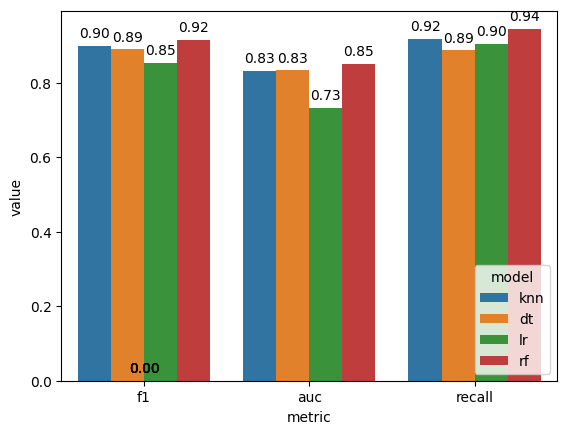

In [ ]:
# results into dataframe
results_df = pd.DataFrame.from_records(results)
# results into bar chart
ax = sns.barplot(x='metric', y='value', hue='model', data=results_df)
# with values for each result columns
for p in ax.patches:
  ax.annotate(
      format(p.get_height(), '.2f'),
      (p.get_x() + p.get_width() / 2., p.get_height()),
      ha = 'center',
      va = 'center',
      xytext = (0, 9),
      textcoords = 'offset points')

plt.show()

## Random forest - advanced

*   Odolnost vůči přeučení: Kombinací stromů se redukuje variabilita jednotlivých stromů
*   Automatická detekce důležitosti atributů: Pomocí model.feature_importances_ můžete zjistit, které atributy nejvíce přispívají k predikci.
*   Snadná interpretace: Výsledky lze snadno vysvětlit díky feature importance a jednoduché struktuře stromů.*  

Omezili jsme počet hodnot, které se zkoušejí, zejména u parametrů s více možnostmi.

In [ ]:
# Best hyperparameters found:  {'bootstrap': True, 'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1,
# 'min_samples_split': 5, 'n_estimators': 200}

In [ ]:
# Initialize the Random Forest classifier
rf_model = RandomForestClassifier()

# Hyperparameters to tune
rf_parameters = {
    'n_estimators': [200],                # Menší rozsah počtu stromů
    'max_features': ['sqrt'],             # Nejčastěji používaná hodnota pro Random Forest
    'max_depth': [20],                    # Snižte počet hloubek
    'min_samples_split': [5],             # Vynechejte nejmenší hodnoty, které jsou časově náročné
    'min_samples_leaf': [1],              # Omezení na realistické hodnoty
    'bootstrap': [True]                   # Bootstrap obvykle zlepšuje výkon, ponechte jako True
}

# Grid search with cross-validation
grid_search = GridSearchCV(estimator=rf_model, param_grid=rf_parameters, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Best model
best_rf_model = grid_search.best_estimator_
print("Best cross-validation accuracy: ", grid_search.best_score_)


Best cross-validation accuracy:  0.872329427980703


In [ ]:
rf_model.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
# Predikce na testovací sadě
y_pred = rf_model.predict(X_test)
y_proba = rf_model.predict_proba(X_test)[:, 1]

In [ ]:
# Hodnocení modelu
print("Classification Report:")
print(classification_report(y_test, y_pred))
print("ROC-AUC Score:", roc_auc_score(y_test, y_proba))

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.77      0.81      2377
           1       0.89      0.93      0.91      4878

    accuracy                           0.88      7255
   macro avg       0.87      0.85      0.86      7255
weighted avg       0.88      0.88      0.88      7255

ROC-AUC Score: 0.9371336677186712


**Macro Average:**
Průměr Precision, Recall a F1-score přes všechny třídy (vážený stejným podílem pro každou třídu, nezávisle na počtu příkladů). Tady:
- Precision: 0.88
- Recall: 0.85
- F1-score: 0.86

**Weighted Average:**
Vážený průměr Precision, Recall a F1-score, kde váhy odpovídají počtu příkladů v každé třídě (support). Lépe odráží skutečnou distribuci dat. Tady:
- Precision: 0.88
- Recall: 0.88
- F1-score: 0.88


**ROC-AUC** (Receiver Operating Characteristic - Area Under Curve):
Měří schopnost modelu správně rozlišit mezi třídami.

Support: **Počet příkladů v testovací sadě pro každou třídu**. Tady: Třída 0("Canceled" : 2377 příkladů. Třída 1 "Not_canceled: 4878 příkladů.


In [ ]:
data = {
    'Class': ['Class 0', 'Class 1'],
    'Precision': [0.85, 0.89],
    'Recall': [0.77, 0.93],
    'F1-score': [0.81, 0.91]
}

###Graf

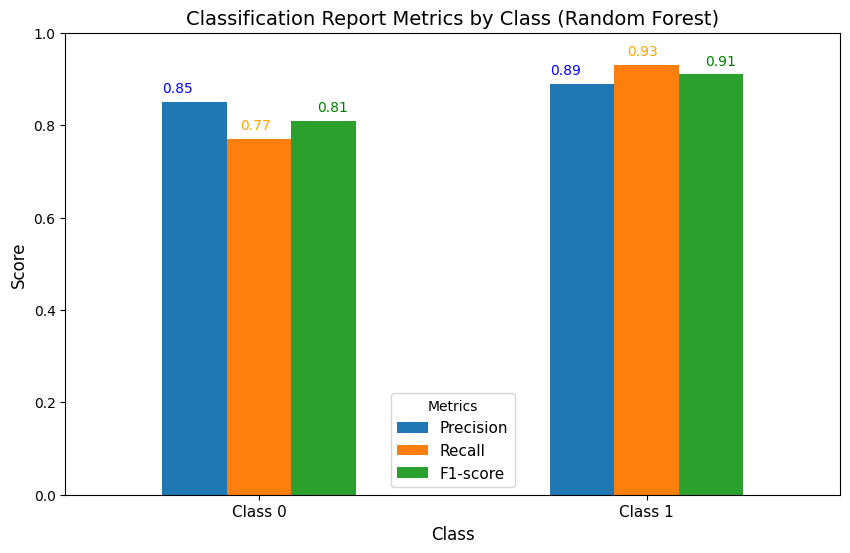

In [ ]:
df = pd.DataFrame(data)
df.plot(x='Class', kind='bar', figsize=(10, 6))

# Přidání hodnot nad sloupce
for index, row in df.iterrows():
    plt.text(index - 0.25, row['Precision'] + 0.02, f"{row['Precision']:.2f}", fontsize=10, color='blue')
    plt.text(index - 0.05, row['Recall'] + 0.02, f"{row['Recall']:.2f}", fontsize=10, color='orange')
    plt.text(index + 0.15, row['F1-score'] + 0.02, f"{row['F1-score']:.2f}", fontsize=10, color='green')

# Nastavení popisků a názvu
plt.title('Classification Report Metrics by Class (Random Forest)', fontsize=14)
plt.xlabel('Class', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.ylim(0, 1)  # Metriky jsou v rozsahu 0-1
plt.xticks(rotation=0, fontsize=11)
plt.legend(title='Metrics', fontsize=11)


Class 0 = "Canceled" (zrušené rezervace)
*   Precision: 85 % správně označil jako "Canceled"
(Měří přesnost predikce pro danou třídu)
*   Recall: 77 % zachytil skutečně "Canceled"
(Měří schopnost modelu zachytit všechny skutečné příklady dané třídy.)
*   F1 score: Kombinuje přesnost a úplnost modelu do jedné metriky.


**Shrnutí**
Model má celkově vysoký výkon:
- Precision je vyšší pro třídu 1 (90 %) než pro třídu 0 (85 %).
- Recall je velmi vysoký pro třídu 1 (94 %), což znamená, že model zachytí téměř všechny "Not_canceled".
- F1-score je lepší pro třídu 1 (0.92) než pro třídu 0 (0.81), což ukazuje lepší rovnováhu mezi přesností a úplností u třídy 1.

ROC-AUC skóre potvrzuje, že model výborně rozlišuje mezi zrušenými a nezrušenými rezervacemi.

In [ ]:
# Získání důležitosti atributů
importances = rf_model.feature_importances_
# Vytvoření dataframe pro vizualizaci
feature_importances = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# Zobrazení tabulky s důležitostí atributů
print(feature_importances)

                                Feature  Importance
4                             lead_time        0.43
8                    avg_price_per_room        0.30
9                no_of_special_requests        0.09
2                     no_of_week_nights        0.06
1                  no_of_weekend_nights        0.04
0                          no_of_adults        0.03
5                          arrival_year        0.03
3            required_car_parking_space        0.01
6                        repeated_guest        0.00
7  no_of_previous_bookings_not_canceled        0.00


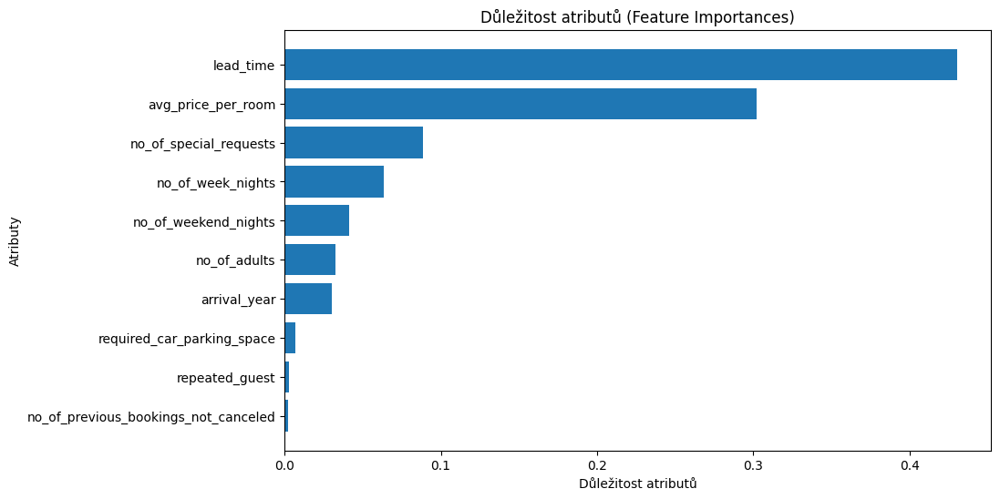

In [ ]:
# Vizualizace důležitosti atributů
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'], align='center')
plt.gca().invert_yaxis()
plt.xlabel('Důležitost atributů')
plt.ylabel('Atributy')
plt.title('Důležitost atributů (Feature Importances)')
plt.show()

### Random forest - threshold adjusting

In [ ]:
# threshold = 0.5
# Class 0 - Precision: 0.86, Recall: 0.77, F1-Score: 0.81
# Class 1 - Precision: 0.89, Recall: 0.94, F1-Score: 0.91
# threshold = 0.6
# Class 0 - Precision: 0.81, Recall: 0.82, F1-Score: 0.81
# Class 1 - Precision: 0.91, Recall: 0.90, F1-Score: 0.91
# threshold = 0.7
# Class 0 - Precision: 0.75, Recall: 0.86, F1-Score: 0.80
# Class 1 - Precision: 0.93, Recall: 0.86, F1-Score: 0.89

In [ ]:
# Predikce
y_proba = rf_model.predict_proba(X_test)[:, 1]
threshold = 0.7  # tuning
y_pred = (y_proba >= threshold).astype(int)

In [ ]:
# Metriky pro třídu 0
precision_0 = precision_score(y_test, y_pred, pos_label=0)
recall_0 = recall_score(y_test, y_pred, pos_label=0)
f1_0 = f1_score(y_test, y_pred, pos_label=0)

In [ ]:
# Metriky pro třídu 1
precision_1 = precision_score(y_test, y_pred, pos_label=1)
recall_1 = recall_score(y_test, y_pred, pos_label=1)
f1_1 = f1_score(y_test, y_pred, pos_label=1)

In [ ]:
# Výpis výsledků
print(f"Class 0 - Precision: {precision_0:.2f}, Recall: {recall_0:.2f}, F1-Score: {f1_0:.2f}")
print(f"Class 1 - Precision: {precision_1:.2f}, Recall: {recall_1:.2f}, F1-Score: {f1_1:.2f}")

Class 0 - Precision: 0.75, Recall: 0.86, F1-Score: 0.80
Class 1 - Precision: 0.93, Recall: 0.86, F1-Score: 0.89


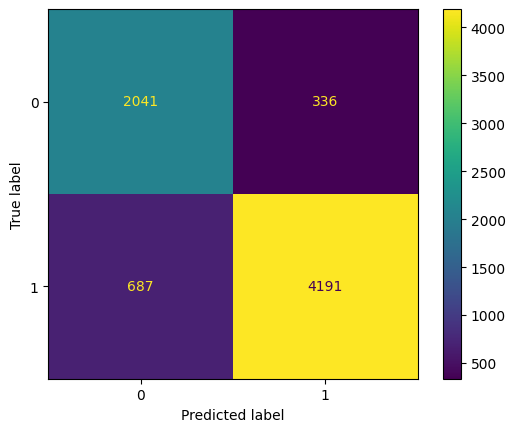

In [ ]:
# confusion matice pro predikce nejlepšího rf modelu
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.show()

Class 0 = "Canceled" (zrušené rezervace)

True negative - 4191 Počet případů, kdy model správně predikoval, že pokoje nebudou zrušeny (skutečná třída = 1, predikovaná třída = 1)

False negative - 336 model chybně predikoval, že pokoje nebudou zrušeny, ale ve skutečnosti byly zrušeny

True positive - 2041 Počet případů, kdy model správně predikoval, že pokoje budou zrušeny (skutečná třída = 0, predikovaná třída = 0)

False positive - 687 model chybně predikoval, že pokoje budou zrušeny, ale ve skutečnosti nebyly zrušeny

Tip na závěr: zvýšit threshold pro korelace

# Final results

Upřednostňujeme třídu 0 ("Canceled")
Je důležité identifikovat všechny zrušené rezervace.
- Chcete zabránit nákladům na přípravu pokojů pro rezervace, které byly zrušeny.
- Zrušené rezervace ovlivňují predikci dostupnosti pokojů.

Chybná klasifikace nezrušené rezervace jako zrušené je méně kritická.